# Лабораторная 5: демонстрация генерации


In [10]:
from pathlib import Path
import json

import torch
from diffusers import StableDiffusionPipeline
from IPython.display import display
from PIL import Image, ImageDraw

ROOT = Path.cwd()
PROMPTS_PATH = ROOT / "prompts.json"
LEARNED_EMBEDS = ROOT / "runs" / "textual_inversion" / "learned_embeds.bin"
TOKEN_OUTPUT_DIR = ROOT / "outputs" / "demo_token"
CLASS_OUTPUT_DIR = ROOT / "outputs" / "demo_class"

with PROMPTS_PATH.open("r", encoding="utf-8") as file:
    config = json.load(file)

TOKEN = config["token"]
CLASS_WORD = config["class_word"]
MODEL_ID = config["base_model"]
SEED = config["seed"]

assert LEARNED_EMBEDS.exists(), f"Нет обученного токена: {LEARNED_EMBEDS}"

print(f"Base model: {MODEL_ID}")
print(f"Personal token: {TOKEN}")
print(f"Class word: {CLASS_WORD}")
print(f"Learned embeds: {LEARNED_EMBEDS}")

Base model: runwayml/stable-diffusion-v1-5
Personal token: bogdan_person
Class word: man
Learned embeds: T:\itmo\cv\cv_labs\lab5\runs\textual_inversion\learned_embeds.bin


## Исходные фото


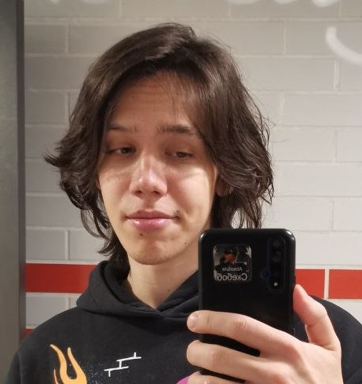

T:\itmo\cv\cv_labs\lab5\data\self\photo_2026-05-30_08-38-40.jpg


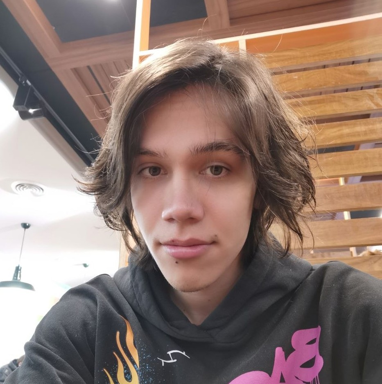

T:\itmo\cv\cv_labs\lab5\data\self\photo_2026-05-30_08-39-15.jpg


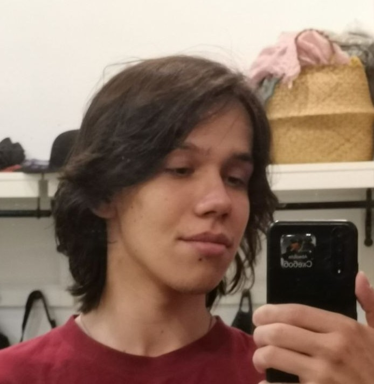

T:\itmo\cv\cv_labs\lab5\data\self\photo_2026-05-30_08-39-27.jpg


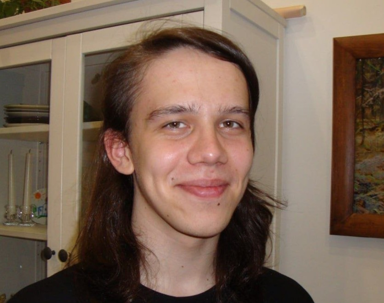

T:\itmo\cv\cv_labs\lab5\data\self\photo_2026-05-30_08-39-31.jpg


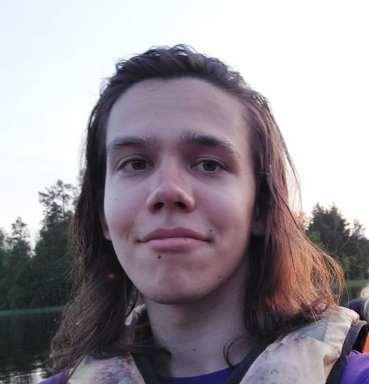

T:\itmo\cv\cv_labs\lab5\data\self\photo_2026-05-30_08-39-43.jpg


In [11]:
REFERENCE_DIR = ROOT / "data" / "self"
reference_paths = sorted(
    path for path in REFERENCE_DIR.iterdir()
    if path.suffix.lower() in {".jpg", ".jpeg", ".png", ".webp"}
)[:5]

assert reference_paths, f"Нет исходных фото в {REFERENCE_DIR}"

for path in reference_paths:
    image = Image.open(path).convert("RGB")
    image.thumbnail((384, 384))
    display(image)
    print(path)

## Загрузка обученной модели


In [12]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
dtype = torch.float16 if device.type == "cuda" else torch.float32

pipe = StableDiffusionPipeline.from_pretrained(
    MODEL_ID,
    torch_dtype=dtype,
    safety_checker=None,
    requires_safety_checker=False,
)
pipe = pipe.to(device)
pipe.load_textual_inversion(str(LEARNED_EMBEDS))

if device.type == "cuda":
    pipe.enable_attention_slicing()

print(f"Pipeline loaded on {device}")

Loading pipeline components...: 100%|██████████| 6/6 [00:05<00:00,  1.12it/s]


Pipeline loaded on cuda


## Промпты с персональным токеном


In [13]:
for prompt in config["token_prompts"]:
    print("-", prompt)

- a high quality realistic portrait photo of bogdan_person in a forest, natural light, 35mm studio photo bright detailed face
- a high quality realistic portrait photo of bogdan_person in a city, street photography, 35mm studio photo detailed face
- a high quality realistic portrait photo of bogdan_person in a beach, sunset light, 35mm studio photo detailed face
- a high quality realistic portrait photo of bogdan_person in a cyberpunk neon street, 35mm photo detailed face
- a high quality realistic portrait photo of bogdan_person wearing metallic futuristic armor, studio photo detailed face


100%|██████████| 40/40 [00:06<00:00,  5.81it/s]


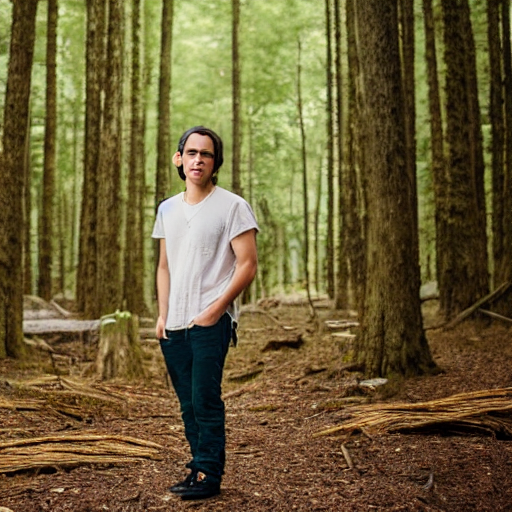

T:\itmo\cv\cv_labs\lab5\outputs\demo_token\01.png


100%|██████████| 40/40 [00:07<00:00,  5.14it/s]


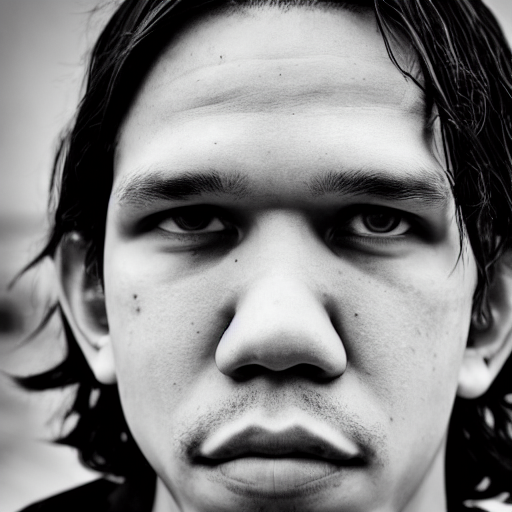

T:\itmo\cv\cv_labs\lab5\outputs\demo_token\02.png


100%|██████████| 40/40 [00:07<00:00,  5.14it/s]


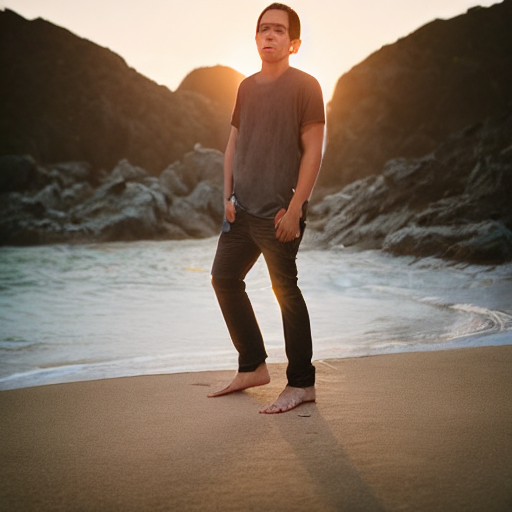

T:\itmo\cv\cv_labs\lab5\outputs\demo_token\03.png


100%|██████████| 40/40 [00:07<00:00,  5.09it/s]


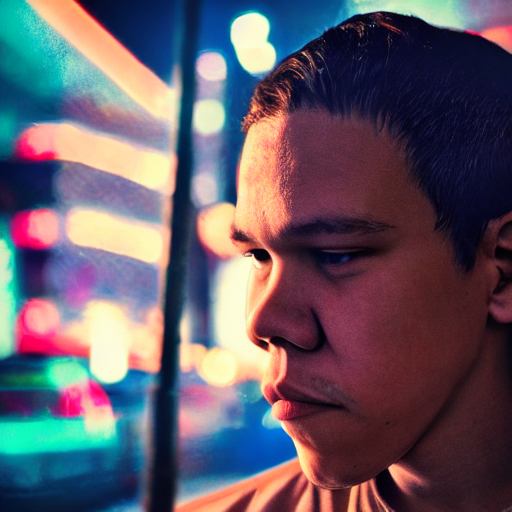

T:\itmo\cv\cv_labs\lab5\outputs\demo_token\04.png


100%|██████████| 40/40 [00:07<00:00,  5.08it/s]


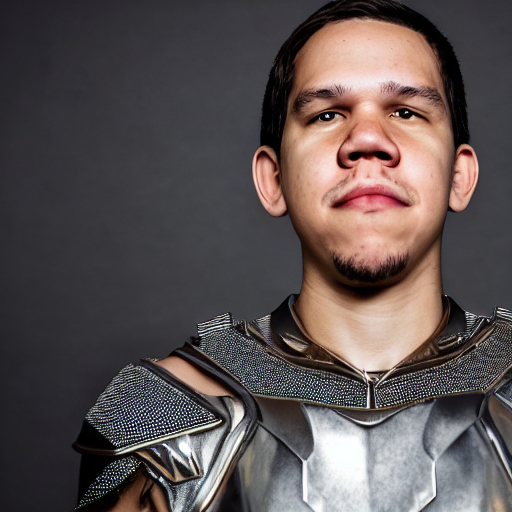

T:\itmo\cv\cv_labs\lab5\outputs\demo_token\05.png


In [14]:
def generate_and_save(prompts, output_dir, steps=40, guidance_scale=7.5, width=512, height=512):
    output_dir.mkdir(parents=True, exist_ok=True)
    generator = torch.Generator(device=device).manual_seed(SEED)
    saved_paths = []

    for index, prompt in enumerate(prompts, start=1):
        image = pipe(
            prompt=prompt,
            num_inference_steps=steps,
            guidance_scale=guidance_scale,
            width=width,
            height=height,
            generator=generator,
        ).images[0]

        path = output_dir / f"{index:02d}.png"
        image.save(path)
        saved_paths.append(path)
        display(image)
        print(path)

    return saved_paths

token_paths = generate_and_save(config["token_prompts"], TOKEN_OUTPUT_DIR, steps=40)

## Baseline: обычный класс без персонального токена


In [15]:
for prompt in config["class_prompts"]:
    print("-", prompt)

- a high quality realistic portrait photo of a man in a forest, natural light, 35mm studio photo detailed face
- a high quality realistic portrait photo of a man in a city, street photography, 35mm studio photo detailed face
- a high quality realistic portrait photo of a man in a beach, sunset light, 35mm studio photo detailed face
- a high quality realistic portrait photo of a man in a cyberpunk neon street, 35mm studio photo detailed face
- a high quality realistic portrait photo of a man wearing metallic futuristic armor, studio photo detailed face


100%|██████████| 40/40 [00:07<00:00,  5.05it/s]


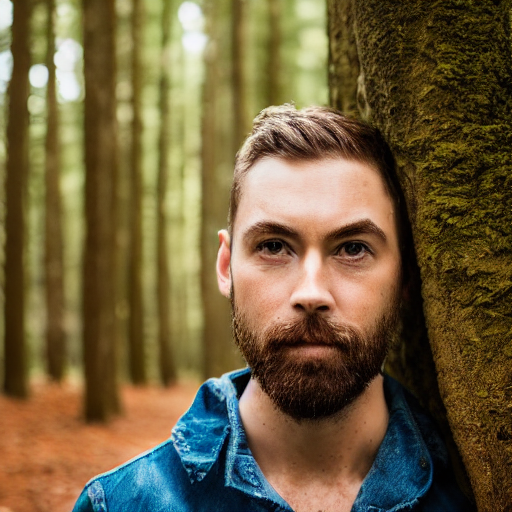

T:\itmo\cv\cv_labs\lab5\outputs\demo_class\01.png


100%|██████████| 40/40 [00:07<00:00,  5.15it/s]


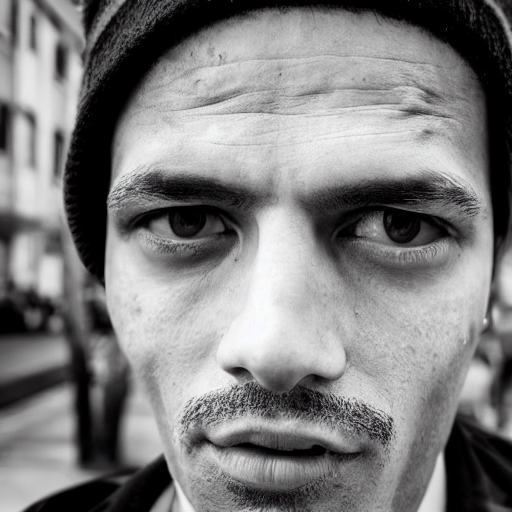

T:\itmo\cv\cv_labs\lab5\outputs\demo_class\02.png


100%|██████████| 40/40 [00:07<00:00,  5.15it/s]


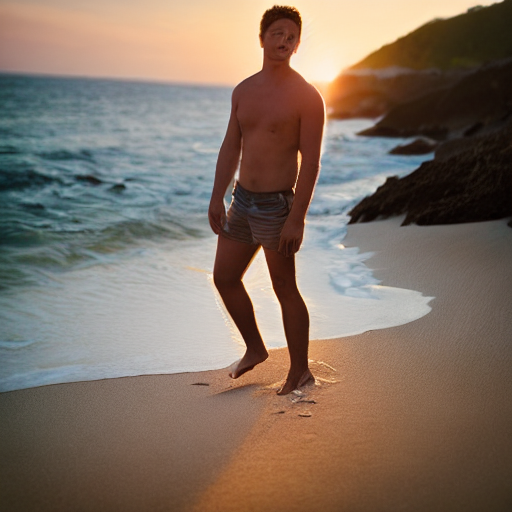

T:\itmo\cv\cv_labs\lab5\outputs\demo_class\03.png


100%|██████████| 40/40 [00:07<00:00,  5.12it/s]


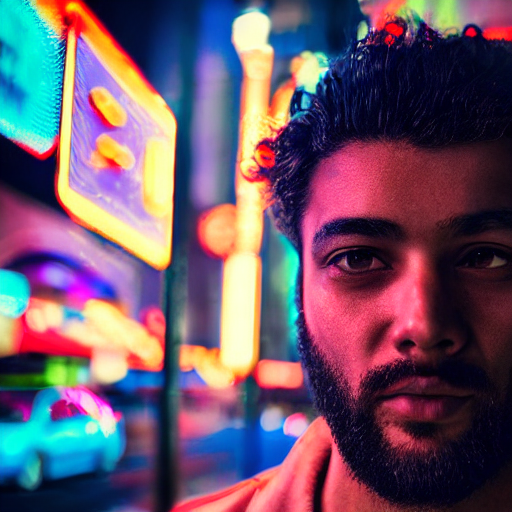

T:\itmo\cv\cv_labs\lab5\outputs\demo_class\04.png


100%|██████████| 40/40 [00:07<00:00,  5.13it/s]


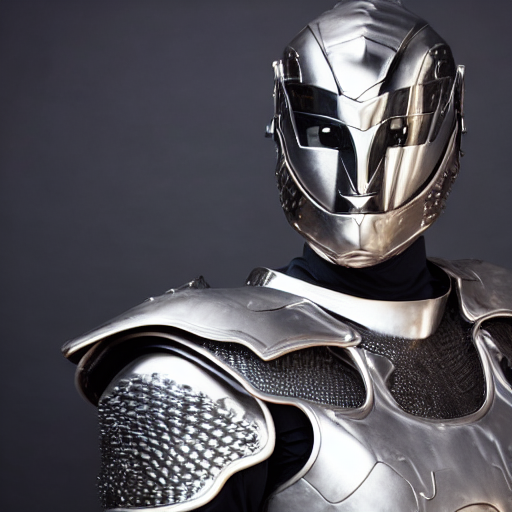

T:\itmo\cv\cv_labs\lab5\outputs\demo_class\05.png


In [16]:
class_paths = generate_and_save(config["class_prompts"], CLASS_OUTPUT_DIR, steps=40)

## Сводная сетка результатов


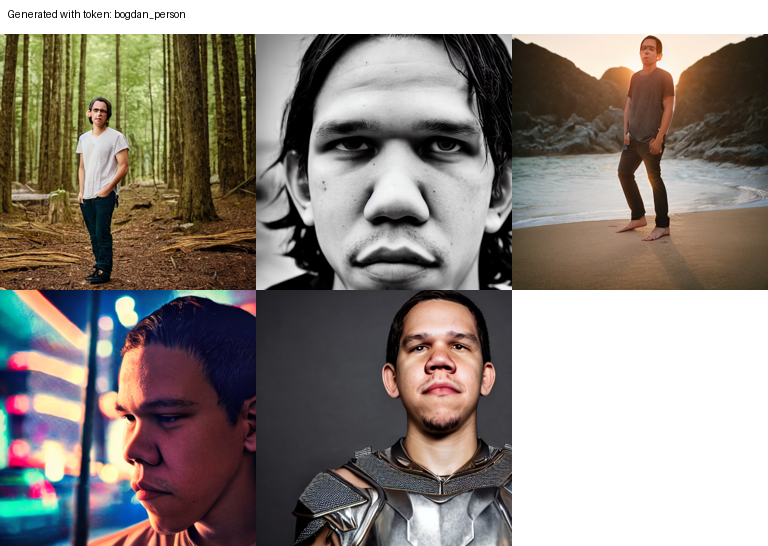

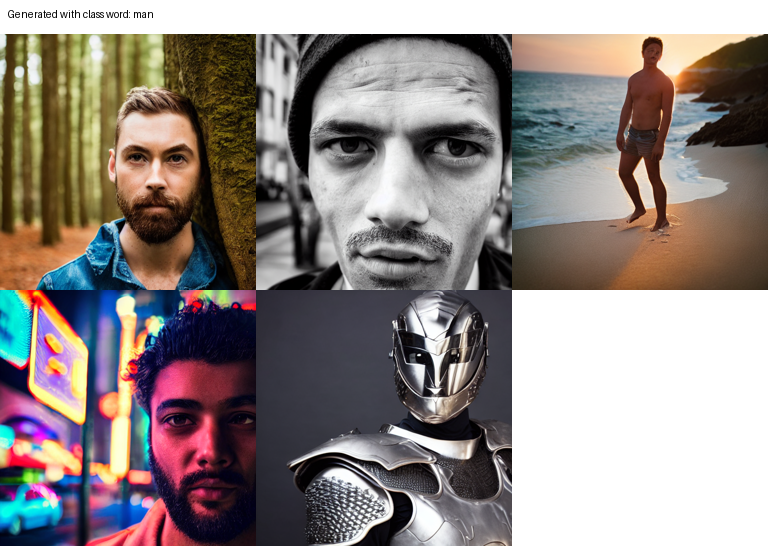

In [17]:
def make_grid(paths, title, cell_size=256):
    images = [Image.open(path).convert("RGB").resize((cell_size, cell_size)) for path in paths]
    columns = min(3, len(images))
    rows = (len(images) + columns - 1) // columns
    title_h = 34
    grid = Image.new("RGB", (columns * cell_size, rows * cell_size + title_h), "white")
    draw = ImageDraw.Draw(grid)
    draw.text((8, 8), title, fill="black")

    for index, image in enumerate(images):
        x = (index % columns) * cell_size
        y = title_h + (index // columns) * cell_size
        grid.paste(image, (x, y))

    return grid

token_grid = make_grid(token_paths, f"Generated with token: {TOKEN}")
class_grid = make_grid(class_paths, f"Generated with class word: {CLASS_WORD}")

token_grid.save(ROOT / "outputs" / "demo_token_grid.png")
class_grid.save(ROOT / "outputs" / "demo_class_grid.png")

display(token_grid)
display(class_grid)

## Метрики


In [18]:
from lab5.metrics import evaluate
 
DEMO_METRICS_PATH = ROOT / "outputs" / "demo_metrics.json"
demo_metrics = evaluate(
 reference_dir=REFERENCE_DIR,
 token_dir=TOKEN_OUTPUT_DIR,
 class_dir=CLASS_OUTPUT_DIR,
 output_path=DEMO_METRICS_PATH,
 device_name=str(device),
)

token_metrics = demo_metrics.get("token_images", {})
class_metrics = demo_metrics.get("class_images", {})
portrait = token_metrics.get("face_similarity", {})

rows = [
 ["demo token", token_metrics.get("clip_score"), portrait.get("mean"), token_metrics.get("lpips_diversity")],
 ["demo class", class_metrics.get("clip_score"), None, class_metrics.get("lpips_diversity")],
]

print("set        | CLIPScore | portrait similarity | LPIPS diversity")
print("-----------|-----------|---------------------|----------------")
for name, clip, sim, lpips_value in rows:
 clip_text = "-" if clip is None else f"{clip:.4f}"
 sim_text = "-" if sim is None else f"{sim:.4f}"
 lpips_text = "-" if lpips_value is None else f"{lpips_value:.4f}"
 print(f"{name:<10} | {clip_text:>9} | {sim_text:>19} | {lpips_text:>14}")

print(f"Saved demo metrics to {DEMO_METRICS_PATH}")
demo_metrics

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: T:\itmo\cv\cv_labs\.venv\Lib\site-packages\lpips\weights\v0.1\alex.pth
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: T:\itmo\cv\cv_labs\.venv\Lib\site-packages\lpips\weights\v0.1\alex.pth
set        | CLIPScore | portrait similarity | LPIPS diversity
-----------|-----------|---------------------|----------------
demo token |    0.2399 |              0.6609 |         0.7299
demo class |    0.2336 |                   - |         0.7295
Saved demo metrics to T:\itmo\cv\cv_labs\lab5\outputs\demo_metrics.json


{'token_images': {'clip_score': 0.23991079032421112,
  'face_similarity': {'mean': 0.6608707308769226,
   'min': 0.6168071031570435,
   'max': 0.7383511662483215,
   'reference_images': 5,
   'generated_images': 5},
  'lpips_diversity': 0.7299388527870179},
 'class_images': {'clip_score': 0.23355085849761964,
  'lpips_diversity': 0.7295261144638061}}